## Shape analysis on "trouble" regions
I put together this analysis to look at the "trouble" regions: the nodes that consistently appeared with a large difference between their theoretical and actual distances. For sphericity, I used:
\begin{equation}
\Psi = \frac{\pi^{\frac{1}{3}}(6V_p)^{\frac{2}{3}}}{A_p}
\end{equation}
Where $\Psi$ is a value between 0 and 1, 1 being a perfect sphere.

In [1]:
from allensdk.core.reference_space_cache import ReferenceSpaceCache
import trimesh
import math
a = ReferenceSpaceCache(25, 'annotation/ccf_2017', manifest='mouse_connectivity_manifest.json')

#region = 997
#[vertices, vertex_normals, faces, face_normals] = a.get_structure_mesh(region)

In [2]:
import pandas as pd
csv = '../../spreadsheets/Hypothalamic Optimization counts.csv'
# Pull data from spreadsheet on which regions are the trouble regions with counts of >5 over optimal distances
df = pd.read_csv(csv)
df = df.set_index('structure-id')
# Create new column for mesh data gathered from API
df['mesh data'] = pd.np.nan
df['mesh data'] = df['mesh data'].astype('object')

In [3]:
# Retrieve mesh data from ABA
# Mesh data for each region is in the form [vertices, vertex_normals, faces, face_normals]
df['mesh data'] = df.apply(lambda x: a.get_structure_mesh(x.name), axis=1)

In [4]:
# Function to make a mesh from mesh data + give it a pretty color
def manage_meshes(x):
    m = trimesh.Trimesh(vertices=x[0], faces=x[2])
    m.visual.vertex_colors = trimesh.visual.random_color()
    return m    

### This render shows all the regions which have an "optimal distance" > 5 away from their actual distance.

In [5]:
df.loc[df['Counts in distance>5'] > 0].iloc[:5]

,structure-abbrev,structure-name,Counts in distance>5,mesh data
structure-id,,,,
194,LHA,Lateral hypothalamic area,7,"([[6411.11, 5722.05, 3949.76], [6429.5, 5755.1..."
491,MM,Medial mammillary nucleus,6,"([[7825.21, 6114.52, 4885.32], [7761.12, 6146...."
88,AHN,Anterior hypothalamic nucleus,6,"([[6135.11, 6385.92, 4781.21], [6107.16, 6340...."
830,DMH,Dorsomedial nucleus of the hypothalamus,6,"([[6922.23, 5892.83, 5016.06], [6871.93, 5948...."
210,LM,Lateral mammillary nucleus,5,"([[7890.32, 6192.88, 4556.79], [7885.65, 6151...."


In [14]:
meshes = []
# Make a new mesh column
df['mesh'] = pd.np.nan
df['mesh'] = df['mesh'].astype('object')
# Turn mesh data into actual meshes
df['mesh'] = df['mesh data'].apply(lambda x: manage_meshes(x))
# Combine all the meshes into one scene and show only the problem meshes
meshes = list(df.mesh.loc[df['Counts in distance>5'] > 0])
meshes = df['mesh'].to_list()
for b in meshes:
    if not b.is_watertight:
        trimesh.repair.fill_holes(b)
trimesh.Scene(df['mesh'].to_list()).show()
#trimesh.scene.scene.append_scenes(scenes).show()

In [15]:
import numpy as np
from scipy.spatial.qhull import Delaunay
from trimesh import Trimesh, transformations
from trimesh.geometry import plane_transform

def _remove_overlapping_triangles(m: Trimesh) -> Trimesh:
    cleaned_mesh = Trimesh()
    used_faces = []
    face_indices = np.arange(0, m.faces.shape[0])

    # For all facets reconstruct the surfaces using Delaunay triangulation
    for facet_faces in m.facets:
        if len(facet_faces):
            used_faces.extend(facet_faces)
            selected_faces = m.faces[facet_faces].flatten()
            facet_vertices = m.vertices[selected_faces]
            to_2d = plane_transform(facet_vertices[0], m.face_normals[facet_faces[0]])
            vertices_2d = transformations.transform_points(
                facet_vertices,
                matrix=to_2d)[:, :2]
            tri = Delaunay(vertices_2d)
            split = Trimesh(vertices=facet_vertices, faces=tri.simplices)
            cleaned_mesh += split

    # Create a mask of faces that were not part of a facet
    mask = np.ones(face_indices.size, dtype=bool)
    mask[np.unique(used_faces)] = False

    # Add those remaining faces back in
    cleaned_mesh += m.submesh([face_indices[mask]], only_watertight=False)
    cleaned_mesh.visual = m.visual
    return cleaned_mesh

In [16]:
for b in meshes:
    b = _remove_overlapping_triangles(b)

trimesh.Scene.

In [13]:
# Top 5 problem regions:
meshes = list(df.mesh.loc[df['Counts in distance>5'] > 0].iloc[:5])
trimesh.Scene(meshes).show()

In [8]:
# Compute sphericity for each region
df['sphericity'] = pd.np.nan
df['sphericity'] = df.mesh.apply(lambda x: pow(math.pi, 1/3)*pow(6*x.volume, 2/3) / x.area)
df.head(5)
# Convert area and volume to mm3
#print('Characteristics for Region [%s]:\nArea: %f, Volume: %f, Sphericity: %f' % (region_name, mesh.area / 1e9, mesh.volume / 1e9, sphericity))

,structure-abbrev,structure-name,Counts in distance>5,mesh data,mesh,sphericity
structure-id,,,,,,
194,LHA,Lateral hypothalamic area,7,"([[6411.11, 5722.05, 3949.76], [6429.5, 5755.1...","<trimesh.Trimesh(vertices.shape=(1672, 3), fac...",0.596850
491,MM,Medial mammillary nucleus,6,"([[7825.21, 6114.52, 4885.32], [7761.12, 6146....","<trimesh.Trimesh(vertices.shape=(466, 3), face...",0.862521
88,AHN,Anterior hypothalamic nucleus,6,"([[6135.11, 6385.92, 4781.21], [6107.16, 6340....","<trimesh.Trimesh(vertices.shape=(713, 3), face...",0.702415
830,DMH,Dorsomedial nucleus of the hypothalamus,6,"([[6922.23, 5892.83, 5016.06], [6871.93, 5948....","<trimesh.Trimesh(vertices.shape=(477, 3), face...",0.675669
210,LM,Lateral mammillary nucleus,5,"([[7890.32, 6192.88, 4556.79], [7885.65, 6151....","<trimesh.Trimesh(vertices.shape=(168, 3), face...",0.706209


### The number of times a node appears in an edge that is > 5 away from the optimal as a function of sphericity:

Text(0, 0.5, 'Counts in distance>5')

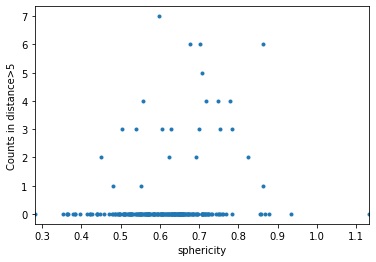

In [9]:
ax = df.plot(x='sphericity', y='Counts in distance>5', style='.')
ax.get_legend().remove()
ax.set_ylabel('Counts in distance>5')
#ax.get_figure().savefig('./sphericity graphs/distance counts vs sphericity.png')

In [10]:
from sklearn.linear_model import LinearRegression
x = pd.DataFrame(df['sphericity'].loc[df['Counts in distance>5'] > 0])
y = pd.DataFrame(df['Counts in distance>5'].loc[df['Counts in distance>5'] > 0])
reg = LinearRegression().fit(x,y)
r2 = 'R\u00b2 = ' + str(round(reg.score(x,y), 6))
y_pred = reg.predict(x)
y_hat = '\u0177 = ' + str(round(reg.coef_[0][0], 6)) + 'x +' + str(round(*reg.intercept_, 6))

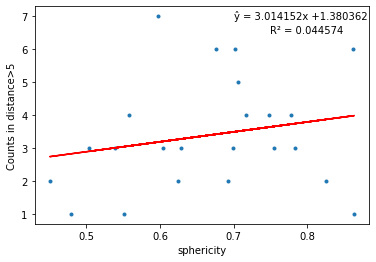

In [11]:
import matplotlib.pyplot as plt
plt.scatter(x,y, marker='.')
plt.plot(x, y_pred, color='red')
plt.text(0.75, 6.5, r2)
plt.text(0.7, 6.9, y_hat)
plt.xlabel('sphericity')
plt.ylabel('Counts in distance>5')
plt.savefig('./sphericity graphs/distance counts vs sphericity.png')
plt.show()

In [12]:
edges_df = pd.read_csv('../../spreadsheets/Hypothalamic Optimization Distances.csv')
edges_df['distance from true'] = abs(edges_df['distance from true'])
#edges_df.head(5)

In [13]:
edges_df['sphericity1'] = edges_df.n1.apply(lambda x: df.sphericity.loc[x])
edges_df['sphericity2'] = edges_df.n2.apply(lambda x: df.sphericity.loc[x])
edges_df['sphericity comb'] = edges_df['sphericity1'] * edges_df['sphericity2']
edges_df.tail(5)

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
644,525,946,5298.104492,0.623699,0.945918,13.936138,13.312440,Supramammillary nucleus,Posterior hypothalamic nucleus,0.557831,0.692563,0.386333
645,88,515,10758.870120,0.620484,1.012361,14.659671,14.039188,Anterior hypothalamic nucleus,Medial preoptic nucleus,0.702415,0.717332,0.503865
646,515,88,6456.455100,0.620484,1.012361,14.661512,14.041028,Medial preoptic nucleus,Anterior hypothalamic nucleus,0.717332,0.702415,0.503865
647,523,515,9591.381836,0.584893,0.969232,14.717813,14.132919,Medial preoptic area,Medial preoptic nucleus,0.504088,0.717332,0.361598
648,515,523,8042.708496,0.584893,0.969232,14.724646,14.139753,Medial preoptic nucleus,Medial preoptic area,0.717332,0.504088,0.361598


### Combined sphericity (defined as the multipled sphericities of both nodes in an edge) as a function of optimal distance from true value:

In [14]:
x = pd.DataFrame(edges_df['distance from true'])
y = pd.DataFrame(edges_df['sphericity comb'])
reg = LinearRegression().fit(x,y)
r2 = 'R\u00b2 = ' + str(round(reg.score(x,y), 6))
y_pred = reg.predict(x)
y_hat = '\u0177 = ' + str(round(reg.coef_[0][0], 6)) + 'x +' + str(round(*reg.intercept_, 6))

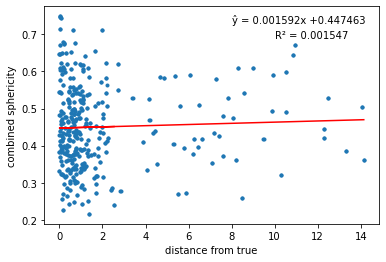

In [15]:
plt.scatter(x,y, marker='.')
plt.plot(x, y_pred, color='red')
plt.text(10, 0.69, r2)
plt.text(8, 0.73, y_hat)
plt.ylabel('combined sphericity')
plt.xlabel('distance from true')
plt.savefig('./sphericity graphs/combined sphericity vs distance from true.png')
plt.show()

### Edge with the minimum combined sphericity:

In [16]:
# Edge with the minimum combined sphericity
edges_df[edges_df['sphericity comb'] == edges_df['sphericity comb'].min()]

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
64,390,797,1581.217285,2.255504,0.978343,0.886341,1.369164,Supraoptic nucleus,Zona incerta,0.450536,0.479188,0.215891
65,797,390,1319.429932,2.255504,0.978343,0.886380,1.369124,Zona incerta,Supraoptic nucleus,0.479188,0.450536,0.215891


### Edge with the maximum combined sphericity:

In [17]:
# Edge with the maximum combined sphericity
edges_df[edges_df['sphericity comb'] == edges_df['sphericity comb'].max()]

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
460,272,38,573.364319,3.517911,0.707998,3.487757,0.030154,Anteroventral periventricular nucleus,Paraventricular hypothalamic nucleus,0.863592,0.867264,0.748962
465,38,272,1795.034180,3.517911,0.707998,3.493854,0.024057,Paraventricular hypothalamic nucleus,Anteroventral periventricular nucleus,0.867264,0.863592,0.748962


### Edge with the maximum distance from the true value:

In [18]:
edges_df[edges_df['distance from true'] == edges_df['distance from true'].max()]

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
648,515,523,8042.708496,0.584893,0.969232,14.724646,14.139753,Medial preoptic nucleus,Medial preoptic area,0.717332,0.504088,0.361598


### Edges containing the node that had the least sphericity:

In [19]:
# Edges with node that has the least sphericity
# Limited to first 5
edges_df[edges_df['sphericity1'] == edges_df['sphericity1'].min()].head(5)

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
0,390,347,0.000000,5.952730,0.520410,3.415775,2.536956,Supraoptic nucleus,Subparaventricular zone,0.450536,0.532664,0.239984
42,390,210,505.553223,2.011219,0.487952,0.308328,1.702890,Supraoptic nucleus,Lateral mammillary nucleus,0.450536,0.706209,0.318172
56,390,946,713.264282,2.315599,0.776279,0.710800,1.604799,Supraoptic nucleus,Posterior hypothalamic nucleus,0.450536,0.692563,0.312025
64,390,797,1581.217285,2.255504,0.978343,0.886341,1.369164,Supraoptic nucleus,Zona incerta,0.450536,0.479188,0.215891
72,390,525,488.898376,2.198499,0.616889,0.879186,1.319314,Supraoptic nucleus,Supramammillary nucleus,0.450536,0.557831,0.251323


In [20]:
# What's that one node with the sphericity > 1?
df[df['sphericity'] == df['sphericity'].max()].head(5)

,structure-abbrev,structure-name,Counts in distance>5,mesh data,mesh,sphericity
structure-id,,,,,,
898,PCG,Pontine central gray,0,"([[10590.0, 4320.34, 4814.55], [10531.7, 4243....","<trimesh.Trimesh(vertices.shape=(941, 3), face...",1.134245


### Plot problem edges' vs normal edges' intensities:

In [21]:
problem_edges = edges_df.loc[edges_df['distance from true'] >= 5]
normal_edges = edges_df.loc[edges_df['distance from true'] < 5]

In [22]:
x1 = pd.DataFrame(normal_edges['distance from true'])
y1 = pd.DataFrame(normal_edges['intensity'])
reg1 = LinearRegression().fit(x1,y1)
r21 = 'R\u00b2 = ' + str(round(reg1.score(x1,y1), 6))
y_pred1 = reg1.predict(x1)
y_hat1 = '\u0177 = ' + str(round(reg1.coef_[0][0], 6)) + 'x +' + str(round(*reg1.intercept_, 6))

x2 = pd.DataFrame(problem_edges['distance from true'])
y2 = pd.DataFrame(problem_edges['intensity'])
reg2 = LinearRegression().fit(x2,y2)
r22 = 'R\u00b2 = ' + str(round(reg2.score(x2,y2), 6))
y_pred2 = reg2.predict(x2)
y_hat2 = '\u0177 = ' + str(round(reg2.coef_[0][0], 6)) + 'x +' + str(round(*reg2.intercept_, 6))

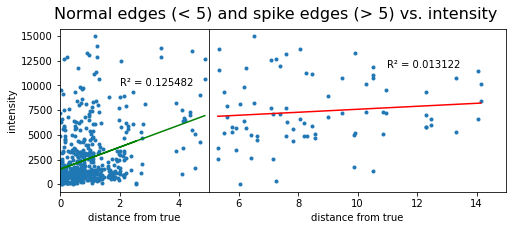

In [23]:
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import figure
f = plt.figure(figsize=(8,3))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 2]) 
ax1 = f.add_subplot(gs[0])
ax1.scatter(normal_edges['distance from true'],normal_edges['intensity'], marker='.')
ax1.plot(x1, y_pred1, color='green')
ax1.set_ylabel('intensity')
ax1.set_xlabel('distance from true')
plt.xlim(0,5)
plt.text(2, 10000, r21)
ax2 = f.add_subplot(gs[1])
ax2.scatter(problem_edges['distance from true'],problem_edges['intensity'], marker='.')
ax2.plot(x2, y_pred2, color='red')
ax2.set_ylabel('intensity')
ax2.set_xlabel('distance from true')
ax2.axes.get_yaxis().set_visible(False)
plt.xlim(5,15)
plt.text(11, 11000, r22)
plt.subplots_adjust(wspace=0)
f.suptitle("""Normal edges (< 5) and spike edges (> 5) vs. intensity""", fontsize=16)
plt.savefig('./sphericity graphs/intensity vs distance from true.png')
plt.show()

### Graph region volume vs distance from true

In [24]:
volumes = pd.read_csv('all brain volumes.csv')

In [25]:
df['volume'] = volumes.set_index('ID')['Total Volume (mm3)']
df.head(5)

,structure-abbrev,structure-name,Counts in distance>5,mesh data,mesh,sphericity,volume
structure-id,,,,,,,
194,LHA,Lateral hypothalamic area,7,"([[6411.11, 5722.05, 3949.76], [6429.5, 5755.1...","<trimesh.Trimesh(vertices.shape=(1672, 3), fac...",0.596850,2.071406
491,MM,Medial mammillary nucleus,6,"([[7825.21, 6114.52, 4885.32], [7761.12, 6146....","<trimesh.Trimesh(vertices.shape=(466, 3), face...",0.862521,0.540641
88,AHN,Anterior hypothalamic nucleus,6,"([[6135.11, 6385.92, 4781.21], [6107.16, 6340....","<trimesh.Trimesh(vertices.shape=(713, 3), face...",0.702415,0.710406
830,DMH,Dorsomedial nucleus of the hypothalamus,6,"([[6922.23, 5892.83, 5016.06], [6871.93, 5948....","<trimesh.Trimesh(vertices.shape=(477, 3), face...",0.675669,0.376063
210,LM,Lateral mammillary nucleus,5,"([[7890.32, 6192.88, 4556.79], [7885.65, 6151....","<trimesh.Trimesh(vertices.shape=(168, 3), face...",0.706209,0.077359


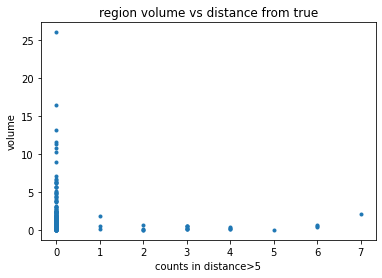

In [26]:
plt.scatter(df['Counts in distance>5'],df['volume'], marker='.')
plt.ylabel('volume')
plt.xlabel('counts in distance>5')
plt.title('region volume vs distance from true')
plt.savefig('./sphericity graphs/volume vs distance from true.png')
plt.show()

## Average distance from true per node?
Then compare volumes

In [27]:
for a in edges_df['n1']:
    try:
        df.loc[a]
        #print(a)
    except:
        pass
        #print('not in')

In [28]:
def check_zero(a):
    if a == 0:
        return 1
    else:
        return a

In [29]:
# Get the average distance from true for each node by summing up all its distances in every node it participates in
df['avg dft'] = (edges_df.groupby(['n1'])['distance from true'].sum() + edges_df.groupby(['n2'])['distance from true'].sum())
# Then divide by the number of edges it's in to get the average
df['avg dft'] =  df.apply(lambda x: x['avg dft'] / check_zero(edges_df.loc[(edges_df['n1'] == x.name) | (edges_df['n2'] == x.name)].shape[0]), axis=1)
df.head(5)

,structure-abbrev,structure-name,Counts in distance>5,mesh data,mesh,sphericity,volume,avg dft
structure-id,,,,,,,,
194,LHA,Lateral hypothalamic area,7,"([[6411.11, 5722.05, 3949.76], [6429.5, 5755.1...","<trimesh.Trimesh(vertices.shape=(1672, 3), fac...",0.596850,2.071406,2.818766
491,MM,Medial mammillary nucleus,6,"([[7825.21, 6114.52, 4885.32], [7761.12, 6146....","<trimesh.Trimesh(vertices.shape=(466, 3), face...",0.862521,0.540641,2.859492
88,AHN,Anterior hypothalamic nucleus,6,"([[6135.11, 6385.92, 4781.21], [6107.16, 6340....","<trimesh.Trimesh(vertices.shape=(713, 3), face...",0.702415,0.710406,2.946467
830,DMH,Dorsomedial nucleus of the hypothalamus,6,"([[6922.23, 5892.83, 5016.06], [6871.93, 5948....","<trimesh.Trimesh(vertices.shape=(477, 3), face...",0.675669,0.376063,2.890278
210,LM,Lateral mammillary nucleus,5,"([[7890.32, 6192.88, 4556.79], [7885.65, 6151....","<trimesh.Trimesh(vertices.shape=(168, 3), face...",0.706209,0.077359,2.724984


In [30]:
x_dft = pd.DataFrame(df.dropna()['avg dft'])
y_vol = pd.DataFrame(df.dropna()['volume'])
reg_dv = LinearRegression().fit(x_dft,y_vol)
r2_dv = 'R\u00b2 = ' + str(round(reg_dv.score(x_dft,y_vol), 6))
y_pred_dv = reg_dv.predict(x_dft)
y_hat_dv = '\u0177 = ' + str(round(reg_dv.coef_[0][0], 6)) + 'x +' + str(round(*reg_dv.intercept_, 6))

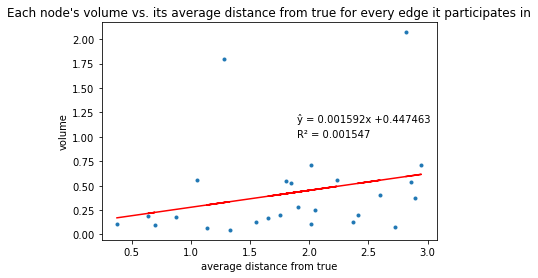

In [31]:
plt.scatter(x_dft,y_vol, marker='.')
plt.plot(x_dft, y_pred_dv, color='red')
plt.text(1.9, 1, r2)
plt.text(1.9, 1.15, y_hat)
plt.ylabel('volume')
plt.xlabel('average distance from true')
plt.title('Each node\'s volume vs. its average distance from true for every edge it participates in')
plt.savefig('./sphericity graphs/volume vs average distance from true.png')
plt.show()

### Go back and run stats on the above. Is it a small but meaningful effect?

In [32]:
# T test
print('Normal edges mean intensity: %3f vs Problem edges mean intensity: %3f' %(normal_edges['intensity'].mean(), problem_edges['intensity'].mean()))

Normal edges mean intensity: 2551.727946 vs Problem edges mean intensity: 7123.143292


In [33]:
problem_edges.head(5)

,n1,n2,intensity,distance,R1+R2,opt. distance,distance from true,structure-name,structure-name.1,sphericity1,sphericity2,sphericity comb
571,194,830,3861.815442,0.760066,1.238558,6.059665,5.299599,Lateral hypothalamic area,Dorsomedial nucleus of the hypothalamus,0.596850,0.675669,0.403273
572,830,194,2875.951250,0.760066,1.238558,6.061982,5.301916,Dorsomedial nucleus of the hypothalamus,Lateral hypothalamic area,0.675669,0.596850,0.403273
573,126,693,10837.542970,1.382932,0.819912,6.736642,5.353710,"Periventricular hypothalamic nucleus, posterio...",Ventromedial hypothalamic nucleus,0.778478,0.754137,0.587079
574,693,126,12681.413390,1.382932,0.819912,6.736642,5.353710,Ventromedial hypothalamic nucleus,"Periventricular hypothalamic nucleus, posterio...",0.754137,0.778478,0.587079
575,390,194,8903.039400,1.081203,1.014411,6.599532,5.518329,Supraoptic nucleus,Lateral hypothalamic area,0.450536,0.596850,0.268902


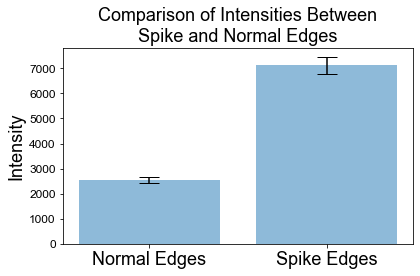

Normal edges mean intensity: 2551.72795
Problem edges mean intensity: 7123.14329
T Test Results:
Variable = -13.40674, p-value = 0.00000


In [60]:
from scipy.stats import ttest_ind

plt.rcParams.update({'font.size': 12, 'figure.autolayout': True, 'font.sans-serif': 'Arial', 'font.family': 'sans-serif'})
plt.rc('axes', titlesize=18)     # fontsize of the axes title
plt.rc('axes', labelsize=18)    # fontsize of the x and y labels
plt.rc('figure', titlesize=18)  # fontsize of the figure title
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels

t = ttest_ind(normal_edges['intensity'], problem_edges['intensity'])
plt.bar(['Normal Edges', 'Spike Edges'], [normal_edges['intensity'].mean(), problem_edges['intensity'].mean()], yerr=[normal_edges['intensity'].sem(), problem_edges['intensity'].sem()], align='center', alpha=0.5, ecolor='black', capsize=10)
plt.title('Comparison of Intensities Between\nSpike and Normal Edges')
plt.ylabel('Intensity')
plt.savefig('./sphericity graphs/spike and normal edge intensities bar graph.png')

plt.show()
# T test
print('Normal edges mean intensity: %.5f\nProblem edges mean intensity: %.5f' %(normal_edges['intensity'].mean(), problem_edges['intensity'].mean()))
print('T Test Results:\nVariable = %.5f, p-value = %.5f' % (t[0], t[1]))